In [1]:
import numpy as np
import cupy as cp
from holotomocupy.holo import G, GT
from holotomocupy.shift import S, ST
from holotomocupy.recon_methods import CTFPurePhase, multiPaganin
from holotomocupy.utils import *
from holotomocupy.proc import remove_outliers
import h5py




astropy module not found
olefile module not found


# Init data sizes and parametes of the PXM of ID16A

In [2]:
n = 2048  # object size in each dimension
pad = n//8
npos= 18*18
pos_step = 1
z1c = -20.1e-3
# thickness of the coded aperture
code_thickness = 1.8e-6 #in m
# feature size
ill_feature_size = 2e-6 #in m

detector_pixelsize = 3.03751e-6
energy = 33.35  # [keV] xray energy
wavelength = 1.2398419840550367e-09/energy  # [m] wave length
focusToDetectorDistance = 1.28  # [m]
sx0 = 3.7e-4
z1 = z1c
z1 = np.tile(z1, [npos])
z2 = focusToDetectorDistance-z1
distances = (z1*z2)/focusToDetectorDistance
magnifications = focusToDetectorDistance/z1
voxelsize = np.abs(detector_pixelsize/magnifications[0]*2048/n)  # object voxel size

# sample size after demagnification
ne = 6144+2*pad
ne = 6462+2*pad
# ne = 4096+2*pad
show = True

flg = f'{n}_{z1c}'
path = f'/data2/vnikitin/nfp_codes'
print(voxelsize)

4.769839921875e-08


## Read data

(1, 81, 2)


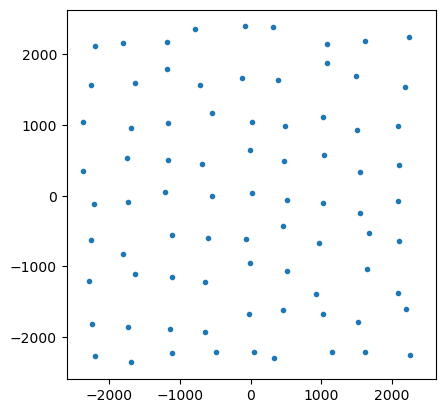

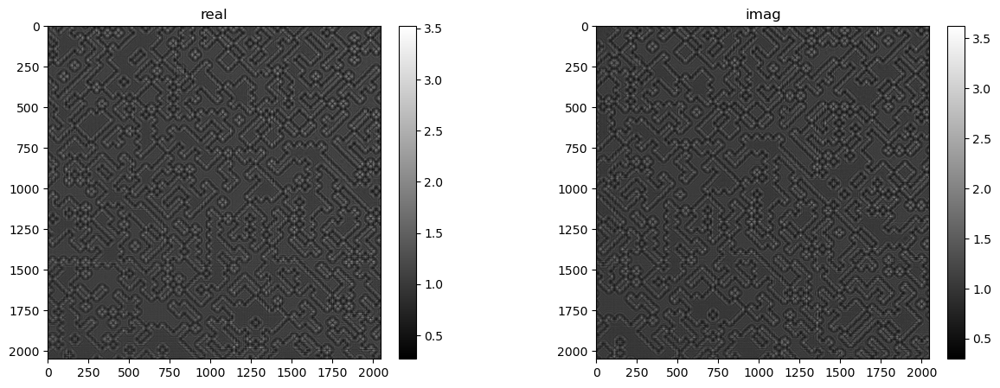

npos=81


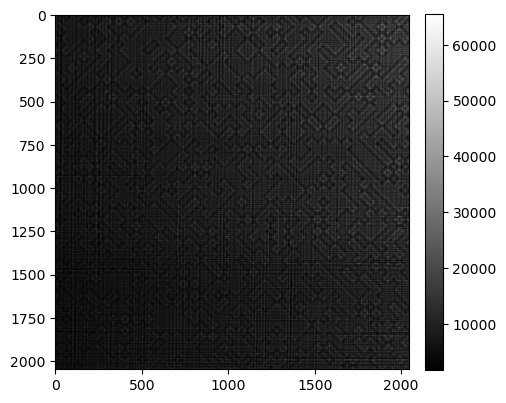

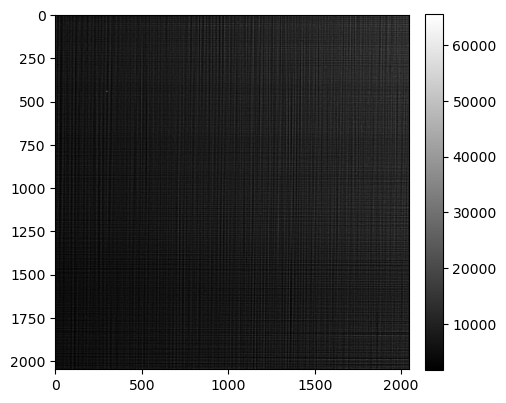

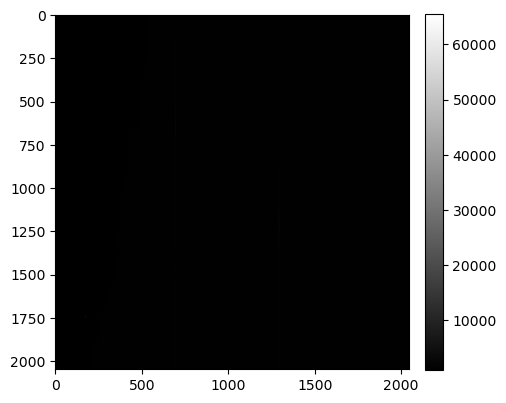

In [3]:
with h5py.File('/data/vnikitin/ESRF/ID16A/20240924/SiemensLH/code2um_nfp18x18_01/code2um_nfp18x18_010000.h5') as fid:
    data0 = fid['/entry_0000/measurement/data'][:npos].astype('float32')
    
with h5py.File('/data/vnikitin/ESRF/ID16A/20240924/SiemensLH/code2um_nfp18x18_01/ref_0000.h5') as fid:
    ref0 = fid['/entry_0000/measurement/data'][:].astype('float32')
with h5py.File('/data/vnikitin/ESRF/ID16A/20240924/SiemensLH/code2um_nfp18x18_01/dark_0000.h5') as fid:
    dark0 = fid['/entry_0000/measurement/data'][:].astype('float32')

data0 = data0[np.newaxis]

# shifts_code0 = np.loadtxt(f'/data/vnikitin/ESRF/ID16A/20240924/positions/shifts_code_nfp18x18ordered.txt')[np.newaxis,:,::-1]
# shifts_code0 = shifts_code0/voxelsize*1e-6
# print(shifts_code0[0,:10])

shifts_code0 = np.load(f'shifts_code_new.npy')[:,:,::-1]
shifts_code0+=150# it appears like that
shifts_code0[:,:,0]*=-1
shifts_code0*=-1 # it appears like that

shifts_code0 = shifts_code0.reshape(1,int(np.sqrt(npos)),int(np.sqrt(npos)),2)
shifts_code0 = shifts_code0[:,::2,::2,:].reshape(1,npos//4,2)
data0 = data0.reshape(1,int(np.sqrt(npos)),int(np.sqrt(npos)),n,n)
data0 = data0[:,::2,::2,:].reshape(1,npos//4,n,n)

ids = np.where((np.abs(shifts_code0[0,:,0])<ne//2+pad)*(np.abs(shifts_code0[0,:,1])<ne//2+pad))[0]#[0:2]
data0 = data0[:,ids]
shifts_code0 = shifts_code0[:,ids]

print(shifts_code0.shape)
plt.plot(shifts_code0[0,:,0],shifts_code0[0,:,1],'.')
plt.axis('square')
plt.show()

mshow_complex(data0[0,0]/ref0[0]+1j*data0[0,1]/ref0[0],show)
npos = len(ids)
print(f'{npos=}')
mshow(data0[0,0],show)
mshow(ref0[0],show)
mshow(dark0[0],show)

In [4]:
data = data0.copy()
ref = ref0.copy()
dark = dark0.copy()
for k in range(npos):
    radius = 7
    threshold = 20000
    data[:,k] = remove_outliers(data[:,k], radius, threshold)
ref[:] = remove_outliers(ref[:], radius, threshold)     
dark[:] = remove_outliers(dark[:], radius, threshold)     

# data[data<=0] = 0
# ref[ref<=0] = 0

data/=np.mean(ref)
dark/=np.mean(ref)
ref/=np.mean(ref)

rdata0 = (data-np.mean(dark,axis=0))/(np.mean(ref,axis=0)-np.mean(dark,axis=0))


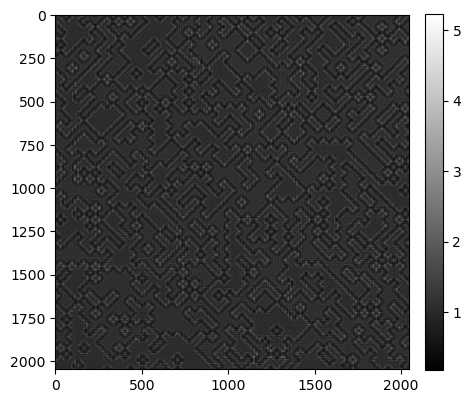

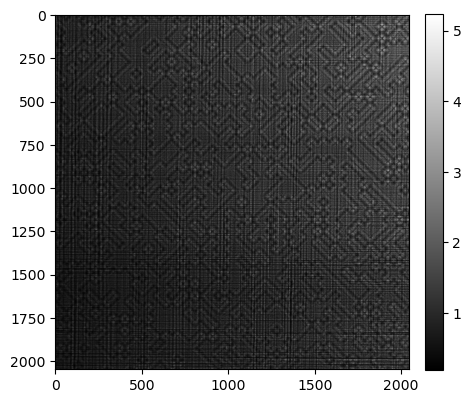

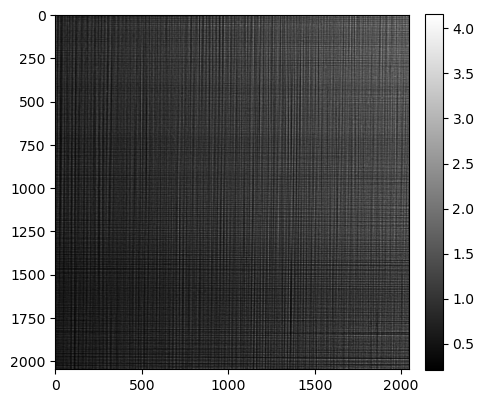

In [5]:
mshow(rdata0[0,0],show)
mshow(data[0,0],show)
mshow(ref[0],show)

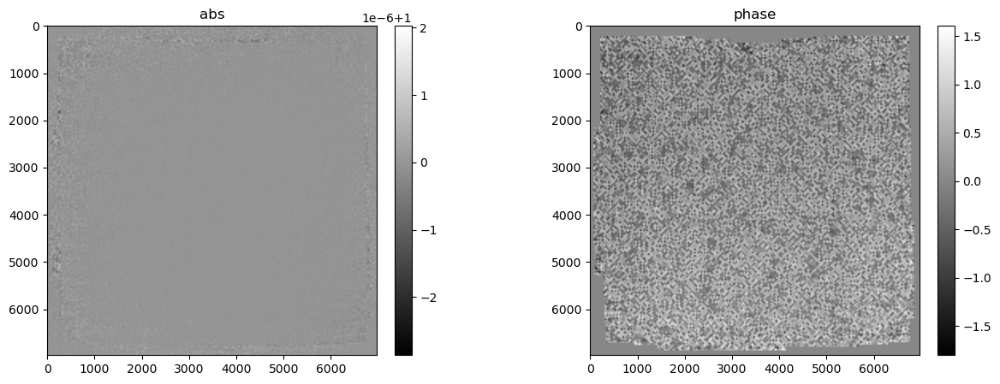

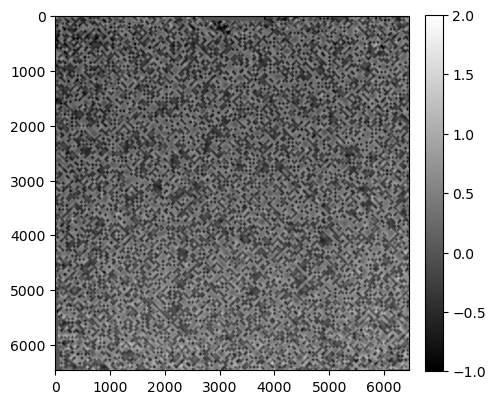

In [6]:
rdata=cp.array(rdata0)
shifts_code = cp.array(shifts_code0)
recMultiPaganin = np.zeros([1,npos,ne,ne],dtype='complex64')
recMultiPaganinr = np.zeros([1,npos,ne,ne],dtype='complex64')# to compensate for overlap
for j in range(0,npos):
    r = multiPaganin(cp.array(rdata[:,j:j+1]),
                       distances[j:j+1], wavelength, voxelsize,  24.05, 5e-2)    
    rr = r*0+1 # to compensate for overlap
    r = cp.pad(r,((0,0), (ne//2-n//2,ne//2-n//2), (ne//2-n//2,ne//2-n//2)),'constant')   
    rr = cp.pad(rr,((0,0), (ne//2-n//2,ne//2-n//2), (ne//2-n//2,ne//2-n//2)),'constant')   
    recMultiPaganin[:,j] = ST(r,shifts_code[:,j]).get()
    recMultiPaganinr[:,j] = ST(rr,shifts_code[:,j]).get()
    
recMultiPaganin = np.sum(recMultiPaganin,axis=1)
recMultiPaganinr = np.sum(recMultiPaganinr,axis=1)

# avoid division by 0
recMultiPaganinr[np.abs(recMultiPaganinr)<5e-2] = 1

# compensate for overlap
recMultiPaganin /= recMultiPaganinr
recMultiPaganin = np.exp(1j*recMultiPaganin)

# pad = 1024*3
mshow_polar(recMultiPaganin[0],show)
mshow(np.angle(recMultiPaganin[0,pad:-pad,pad:-pad]),show,vmax=2,vmin=-1)


# Construct operators


In [7]:
def Lop(psi):
    psi = cp.array(psi)

    data = cp.zeros([psi.shape[0], npos, n, n], dtype='complex64')
    for i in range(npos):
        psir = psi[:,i].copy()       
        psir = G(psir, wavelength, voxelsize, distances[i])
        data[:, i] = psir[:, pad:n+pad, pad:n+pad]
    return data

def LTop(data):
    psi = cp.zeros([data.shape[0],npos, n+2*pad, n+2*pad], dtype='complex64')

    for j in range(npos):
        psir = cp.pad(data[:, j], ((0, 0), (pad, pad), (pad, pad))).astype('complex64')
        psir = GT(psir, wavelength, voxelsize, distances[j])        
        psi[:,j] = psir
    return psi

def Sop(psi):
    psi = cp.array(psi)

    data = cp.zeros([psi.shape[0], npos, n+2*pad, n+2*pad], dtype='complex64')
    for i in range(npos):
        psir = psi.copy()
    
        # shift and crop the code 
        psir = S(psir, shifts_code[:, i])
        nee = psir.shape[1]        
        data[:,i] = psir[:, nee//2-n//2-pad:nee//2+n//2+pad, nee//2-n//2-pad:nee//2+n//2+pad]
    return data

def STop(data):
    psi = cp.zeros([data.shape[0], ne, ne], dtype='complex64')

    for j in range(npos):
        psir = cp.pad(data[:,j],((0,0),(ne//2-n//2-pad,ne//2-n//2-pad),(ne//2-n//2-pad,ne//2-n//2-pad)))        
        psi += ST(psir,shifts_code[:,j])
    return psi


tmp = cp.array(data)
arr1 = cp.pad(tmp[:,0],((0,0),(ne//2-n//2,ne//2-n//2),(ne//2-n//2,ne//2-n//2)),'symmetric')     
prb1 = cp.ones([1,n+2*pad,n+2*pad],dtype='complex64')
shifts_code = cp.array(shifts_code0)
arr2 = Sop(arr1)
arr3 = STop(arr2)

arr4 = Lop(arr2)
arr5 = LTop(arr4)


print(f'{cp.sum(arr1*cp.conj(arr3))}==\n{cp.sum(arr2*cp.conj(arr2))}')
print(f'{cp.sum(arr2*cp.conj(arr5))}==\n{cp.sum(arr4*cp.conj(arr4))}')

(712947584-38.832862854003906j)==
(712947584+3.382434332621642e-10j)
(459070464-19.370361328125j)==
(459070528-0.00011314054427202791j)


#### Reconstruction with the CG (Carlsson) with Hessians

(1, 81, 2048, 2048) (1, 6974, 6974) (1, 2560, 2560)
0) alpha=0.00622, err=3.55952e+06


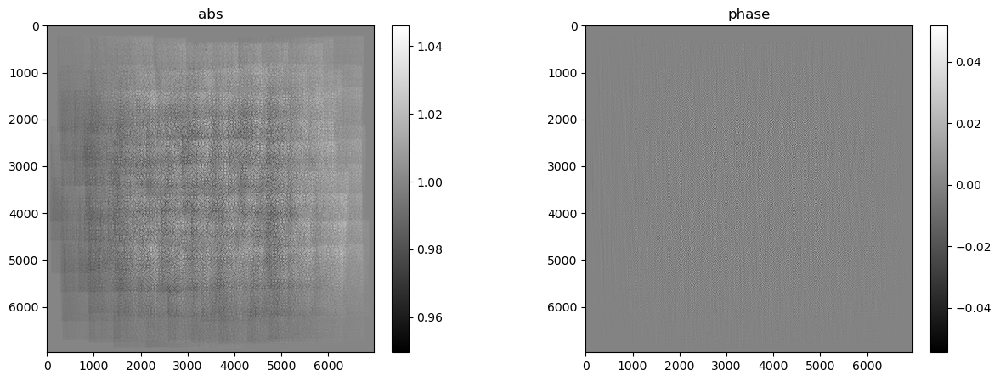

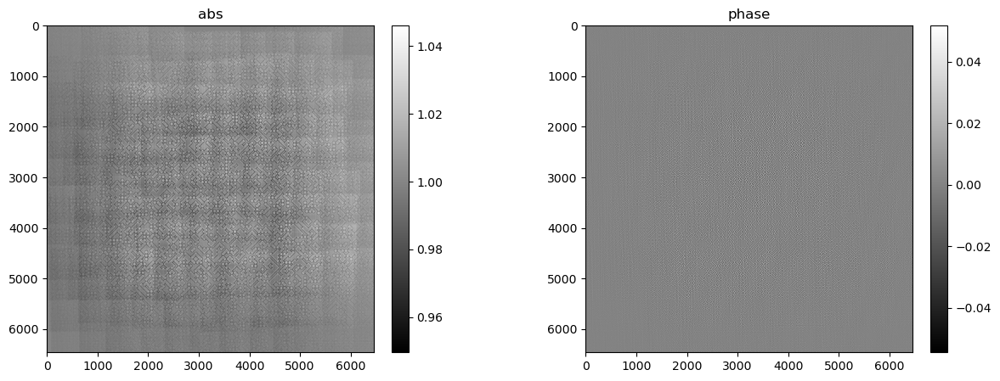

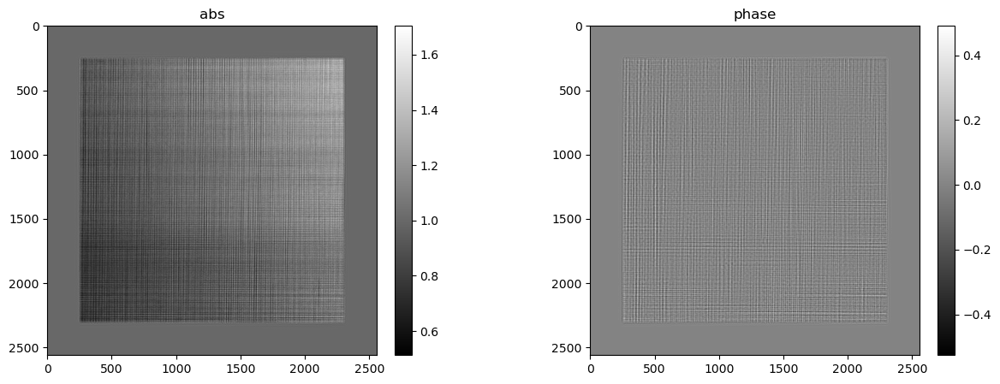

1) alpha=0.04184, err=2.02454e+06
2) alpha=0.00957, err=1.94504e+06
3) alpha=0.04006, err=1.76743e+06
4) alpha=0.01130, err=1.74540e+06
5) alpha=0.04767, err=1.67347e+06
6) alpha=0.01842, err=1.65606e+06
7) alpha=0.05671, err=1.57266e+06
8) alpha=0.01515, err=1.53075e+06
9) alpha=0.07224, err=1.71993e+06
10) alpha=0.00382, err=1.65894e+06
11) alpha=0.01135, err=1.36815e+06
12) alpha=0.01913, err=1.30905e+06
13) alpha=0.03697, err=1.10292e+06
14) alpha=0.01384, err=1.06445e+06
15) alpha=0.03537, err=9.63924e+05
16) alpha=0.01016, err=9.45319e+05


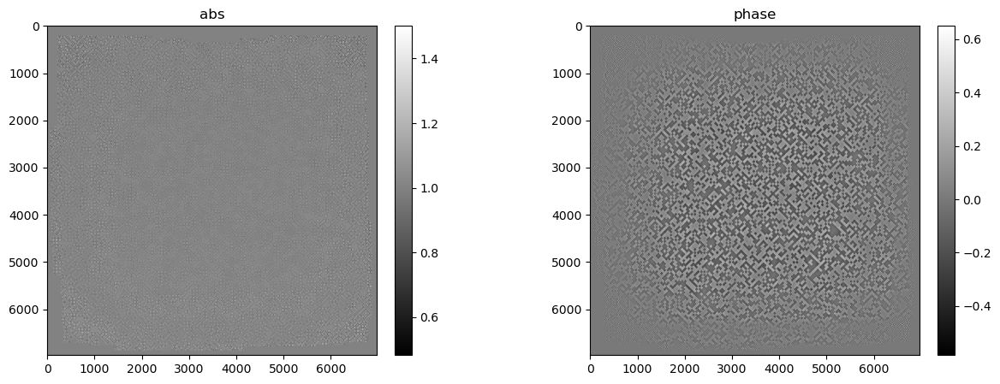

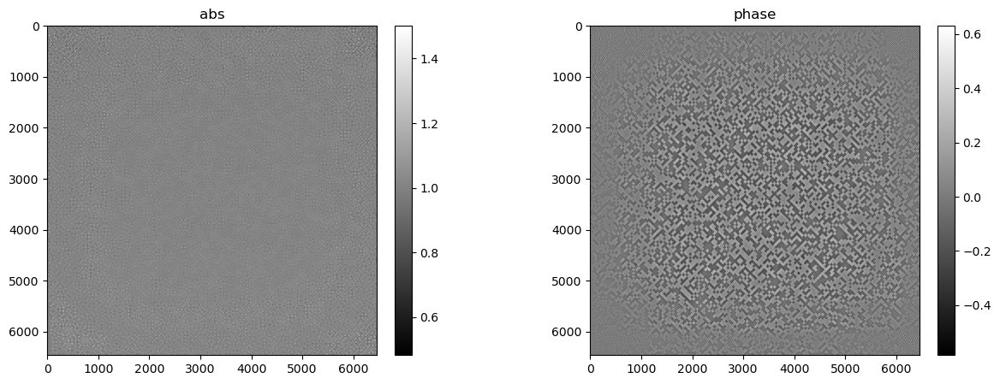

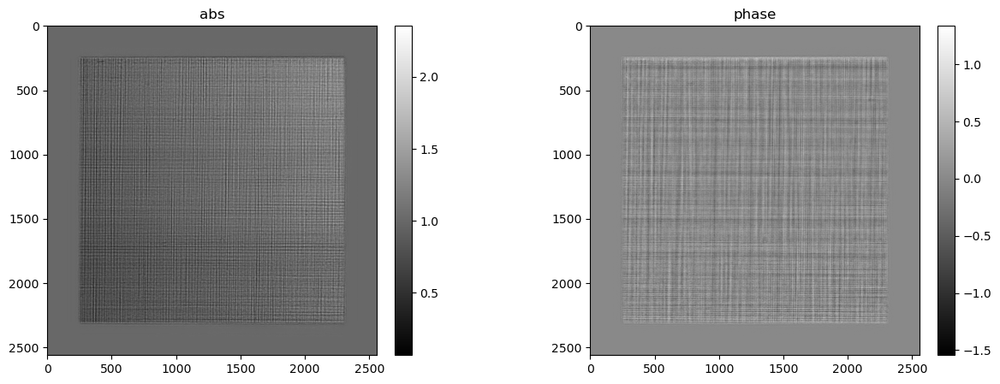

17) alpha=0.05135, err=8.89476e+05
18) alpha=0.01018, err=8.73002e+05
19) alpha=0.05448, err=8.36085e+05
20) alpha=0.01014, err=8.17675e+05
21) alpha=0.04059, err=7.93491e+05
22) alpha=0.01303, err=7.73566e+05
23) alpha=0.03901, err=7.57679e+05
24) alpha=0.01436, err=7.42916e+05
25) alpha=0.03317, err=7.30256e+05
26) alpha=0.01627, err=7.15041e+05
27) alpha=0.03421, err=7.03300e+05
28) alpha=0.01642, err=6.89510e+05
29) alpha=0.03696, err=6.79531e+05
30) alpha=0.01587, err=6.67759e+05
31) alpha=0.03077, err=6.60562e+05
32) alpha=0.01884, err=6.49380e+05


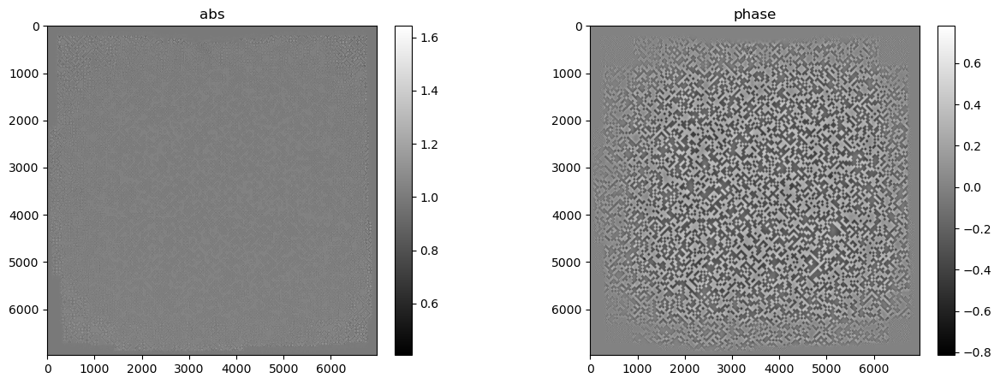

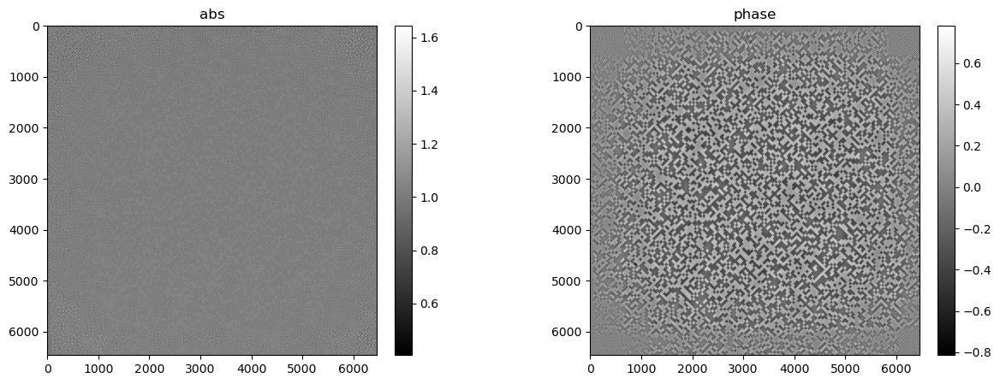

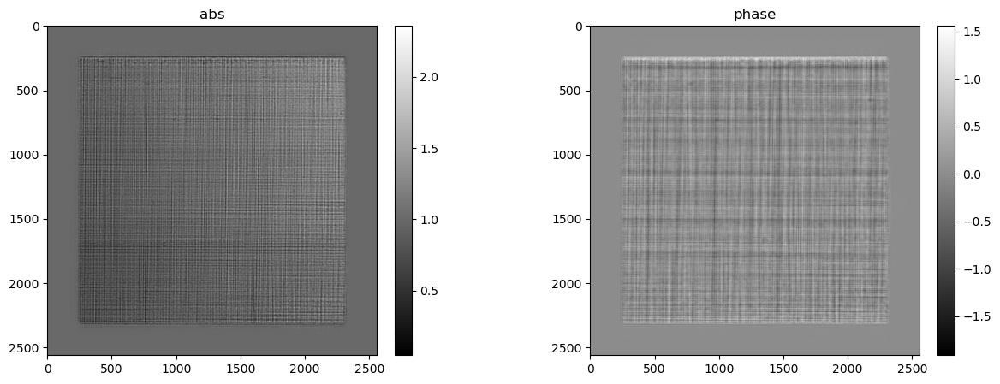

33) alpha=0.02671, err=6.43733e+05
34) alpha=0.02155, err=6.33952e+05
35) alpha=0.01883, err=6.30181e+05
36) alpha=0.02604, err=6.22272e+05
37) alpha=0.01367, err=6.19257e+05
38) alpha=0.03615, err=6.12367e+05
39) alpha=0.01281, err=6.09481e+05
40) alpha=0.03728, err=6.04035e+05
41) alpha=0.01226, err=6.01412e+05
42) alpha=0.03395, err=5.97406e+05
43) alpha=0.01240, err=5.94833e+05
44) alpha=0.03004, err=5.91936e+05
45) alpha=0.01475, err=5.89347e+05
46) alpha=0.02946, err=5.86945e+05
47) alpha=0.01585, err=5.84616e+05
48) alpha=0.02676, err=5.82662e+05


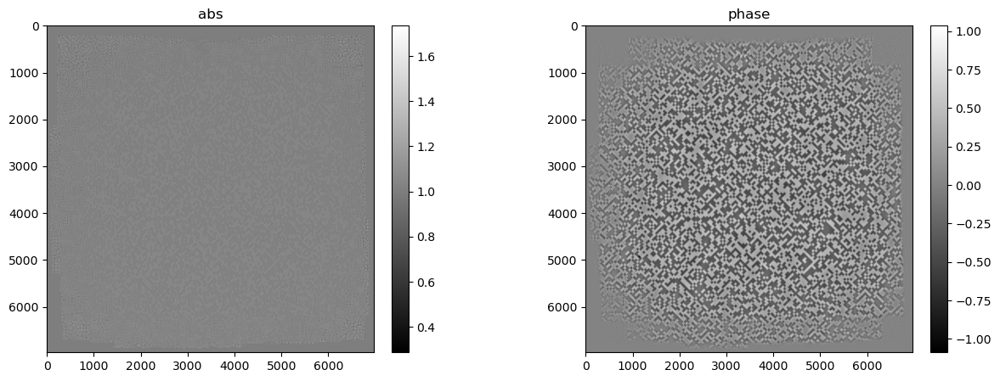

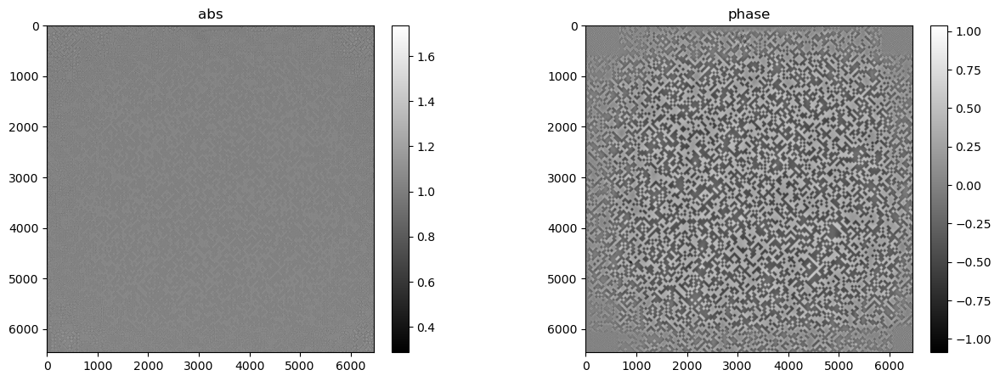

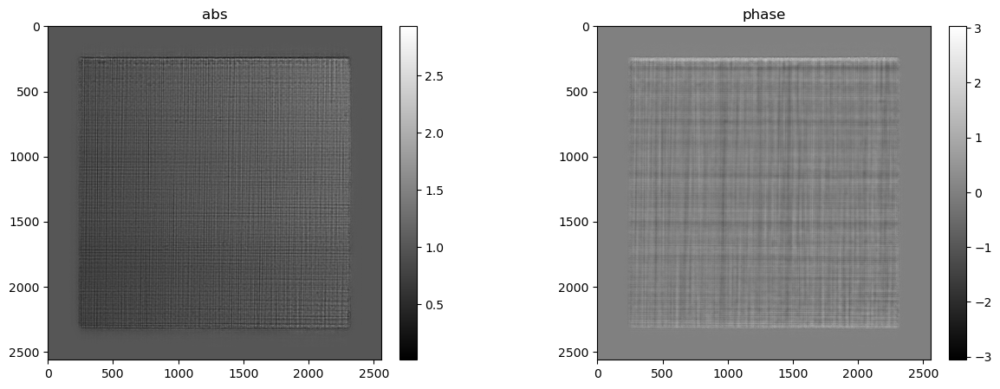

49) alpha=0.01638, err=5.80507e+05
50) alpha=0.02335, err=5.78965e+05
51) alpha=0.01908, err=5.76804e+05
52) alpha=0.02116, err=5.75532e+05
53) alpha=0.02200, err=5.73415e+05
54) alpha=0.01849, err=5.72349e+05
55) alpha=0.02650, err=5.70263e+05
56) alpha=0.01731, err=5.69298e+05
57) alpha=0.02957, err=5.67301e+05
58) alpha=0.01463, err=5.66429e+05
59) alpha=0.03155, err=5.64590e+05
60) alpha=0.01238, err=5.63666e+05
61) alpha=0.03825, err=5.61881e+05
62) alpha=0.01285, err=5.60841e+05
63) alpha=0.03928, err=5.59166e+05
64) alpha=0.01296, err=5.58058e+05


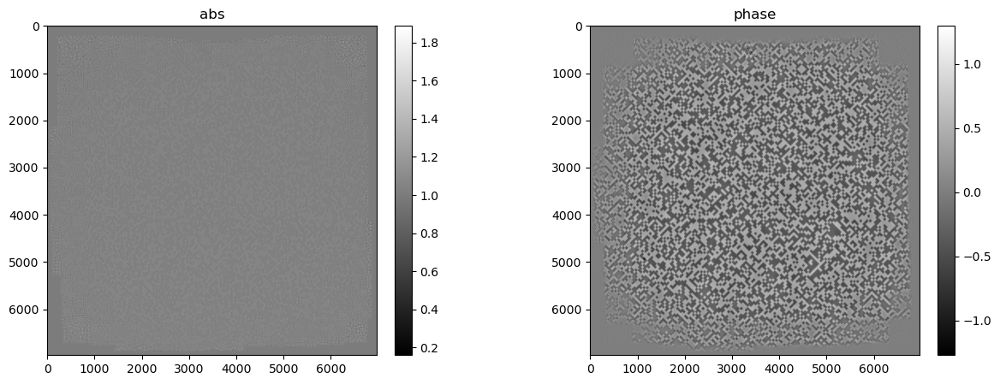

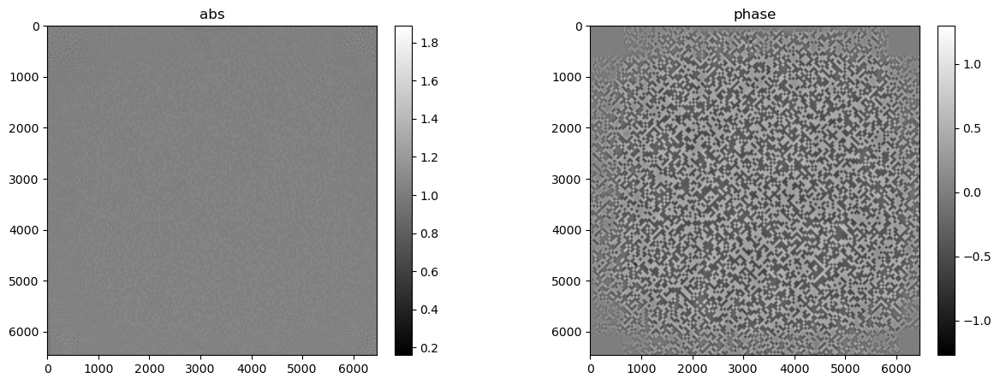

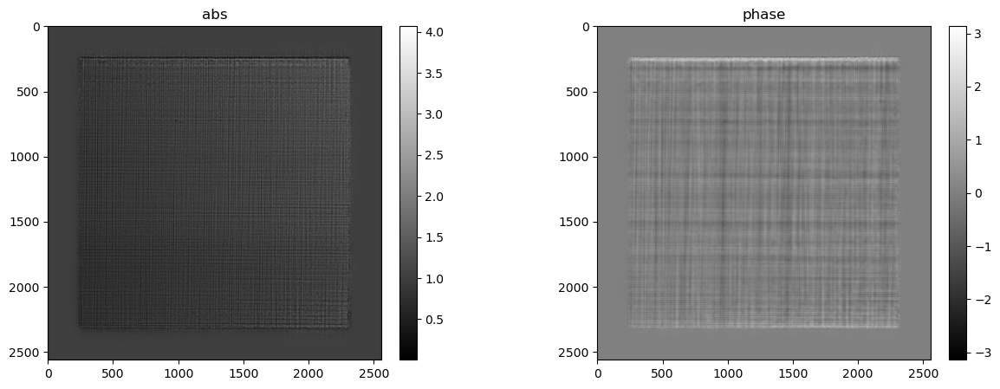

65) alpha=0.03205, err=5.56690e+05
66) alpha=0.01440, err=5.55377e+05
67) alpha=0.02444, err=5.54300e+05
68) alpha=0.01933, err=5.52782e+05
69) alpha=0.02045, err=5.51818e+05
70) alpha=0.02303, err=5.50269e+05
71) alpha=0.01755, err=5.49360e+05
72) alpha=0.02542, err=5.47835e+05
73) alpha=0.01546, err=5.46958e+05
74) alpha=0.02622, err=5.45496e+05
75) alpha=0.01447, err=5.44603e+05
76) alpha=0.02782, err=5.43181e+05
77) alpha=0.01528, err=5.42251e+05
78) alpha=0.02910, err=5.40842e+05
79) alpha=0.01536, err=5.39932e+05
80) alpha=0.02880, err=5.38570e+05


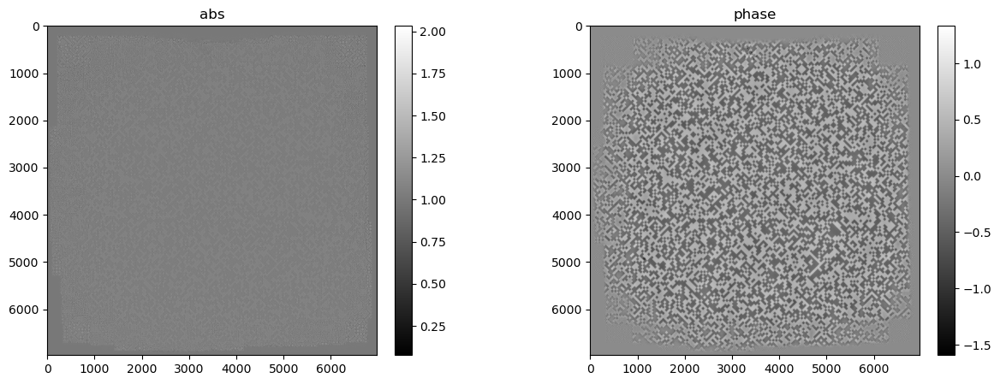

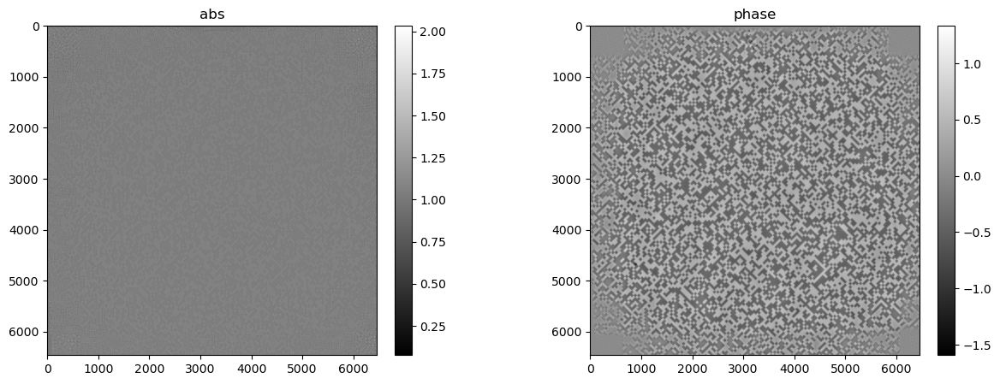

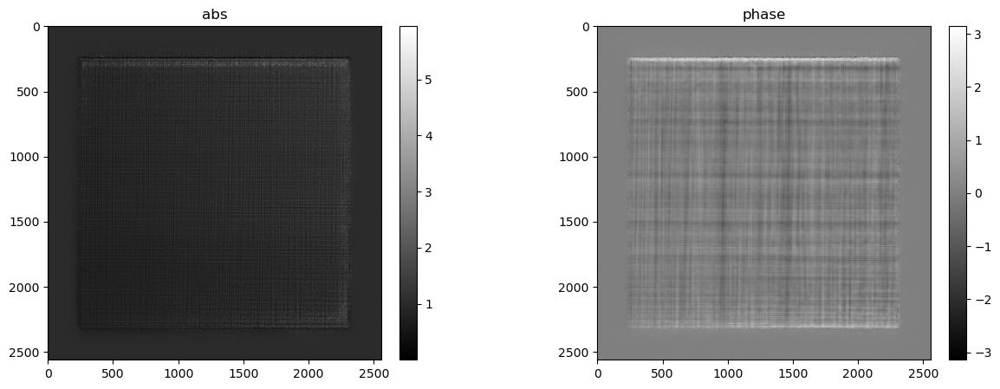

81) alpha=0.01408, err=5.37674e+05
82) alpha=0.02808, err=5.36421e+05
83) alpha=0.01378, err=5.35422e+05
84) alpha=0.02989, err=5.34225e+05
85) alpha=0.01506, err=5.33078e+05
86) alpha=0.02988, err=5.31949e+05
87) alpha=0.01637, err=5.30702e+05
88) alpha=0.02606, err=5.29712e+05
89) alpha=0.01821, err=5.28397e+05
90) alpha=0.01868, err=5.27610e+05
91) alpha=0.02302, err=5.26231e+05
92) alpha=0.01472, err=5.25501e+05
93) alpha=0.02985, err=5.24114e+05
94) alpha=0.01364, err=5.23353e+05
95) alpha=0.03153, err=5.22049e+05
96) alpha=0.01311, err=5.21225e+05


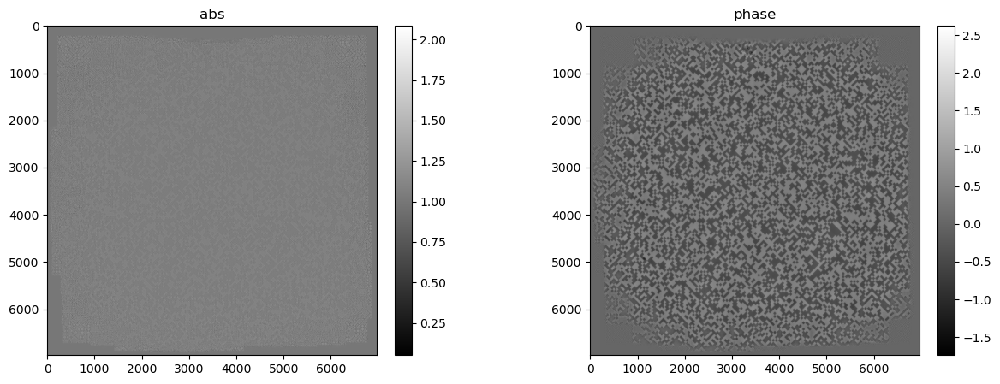

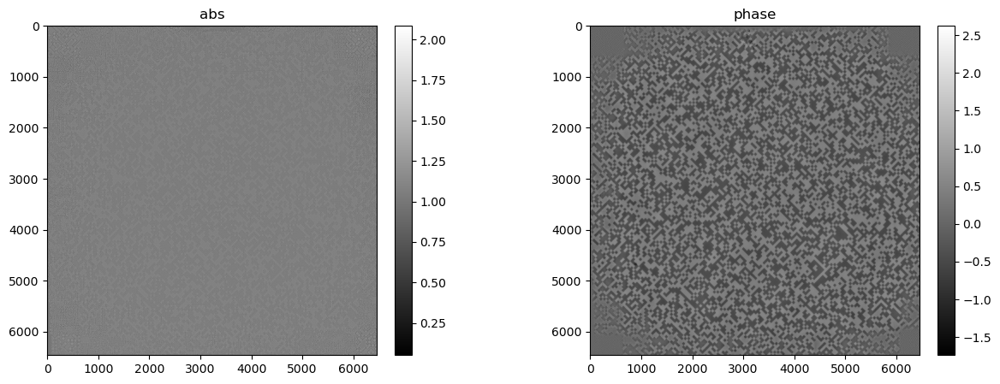

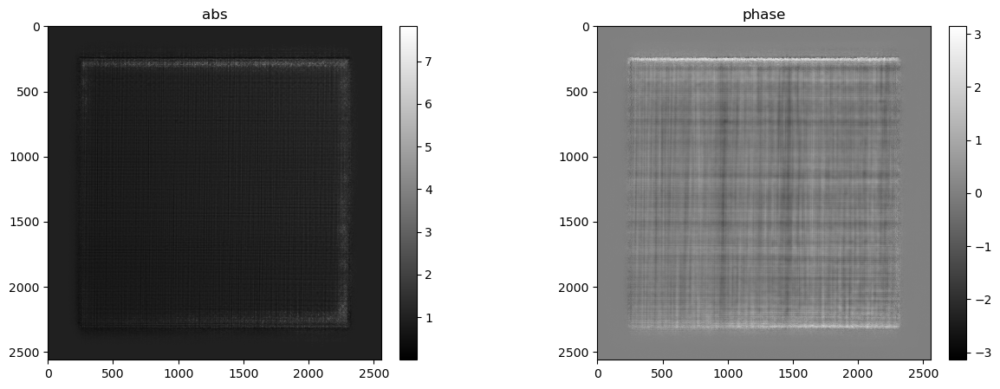

97) alpha=0.02983, err=5.20067e+05
98) alpha=0.01373, err=5.19140e+05
99) alpha=0.02532, err=5.18172e+05
100) alpha=0.01595, err=5.17137e+05
101) alpha=0.02086, err=5.16313e+05
102) alpha=0.01929, err=5.15227e+05
103) alpha=0.01804, err=5.14471e+05


: 

In [8]:
def redot(a,b):
    return cp.sum(a.real*b.real+a.imag*b.imag)

def hessian2(Lpsi,Lpsi1,Lpsi2,data):
    l0 = Lpsi/cp.abs(Lpsi)
    d0 = data/cp.abs(Lpsi)
    v1 = redot(1-d0,cp.real(Lpsi1*cp.conj(Lpsi2)))
    v2 = redot(d0,cp.real(cp.conj(l0)*Lpsi1)*cp.real(cp.conj(l0)*Lpsi2))
    return 2*(v1+v2)

def minf(fpsi,data):
    f = np.linalg.norm(np.abs(fpsi)-data)**2
    return f

def cg_holo(data, init_psi,init_prb,  pars):
    
    data = np.sqrt(data)
    
    psi = init_psi.copy()
    prb = init_prb.copy()

    erra = np.zeros(pars['niter'])
    alphaa = np.zeros(pars['niter'])
    
    for i in range(pars['niter']):                                        
        
        Lpsi = Lop(Sop(psi)*prb)                
        gradx = 2*LTop(Lpsi-data*(Lpsi/cp.abs(Lpsi)))  
        
        gradpsi = STop(gradx*cp.conj(prb))                     
        gradprb = cp.sum(gradx*cp.conj(Sop(psi)),axis=1)
        
        if i==0:
            etapsi = -gradpsi
            etaprb = -gradprb
        else:
            Lpsi = Lop(Sop(psi)*prb)            
            Lksi = Lop(Sop(gradpsi)*prb+Sop(psi)*gradprb)   
            Leta = Lop(Sop(etapsi)*prb+Sop(psi)*etaprb)     
            # top
            top = hessian2(Lpsi,Lksi,Leta,data)
            top += redot(gradx,Sop(gradpsi)*etaprb+Sop(etapsi)*gradprb)
            # bottom
            bottom = hessian2(Lpsi,Leta,Leta,data)
            bottom += 2*redot(gradx,Sop(etapsi)*etaprb)

            beta = top/bottom
            
            etapsi = -gradpsi + beta*etapsi
            etaprb = -gradprb + beta*etaprb

        #top
        top = -redot(gradpsi,etapsi)-redot(gradprb,etaprb)
        # bottom
        Lpsi = Lop(Sop(psi)*prb)
        Leta = Lop(Sop(etapsi)*prb+Sop(psi)*etaprb)
        
        bottom = hessian2(Lpsi,Leta,Leta,data)
        bottom += 2*redot(gradx,Sop(etapsi)*etaprb)
        
        alpha = top/bottom

        psi += alpha*etapsi
        prb += alpha*etaprb

        if i % pars['err_step'] == 0:
            fpsi = Lop(Sop(psi)*prb)
            err = minf(fpsi,data)
            erra[i] = err
            alphaa[i] = alpha
            print(f'{i}) {alpha=:.5f}, {err=:1.5e}')

        if i % pars['vis_step'] == 0 and pars['vis_step']>0 :
            mshow_polar(psi[0],show)
            mshow_polar(psi[0,pad:-pad,pad:-pad],show)
            mshow_polar(prb[0],show)
            dxchange.write_tiff(cp.angle(psi[0]).get(),f'{path}/rec_code_angle{flg}/{i:03}',overwrite=True)
            dxchange.write_tiff(cp.angle(prb[0]).get(),f'{path}/rec_prb_angle{flg}/{i:03}',overwrite=True)
            dxchange.write_tiff(cp.abs(psi[0]).get(),f'{path}/rec_code_abs{flg}/{i:03}',overwrite=True)
            dxchange.write_tiff(cp.abs(prb[0]).get(),f'{path}/rec_prb_abs{flg}/{i:03}',overwrite=True)
            
            # np.save(f'{path}/rec_code_{flg}_{i:03}',psi.get())
            # np.save(f'{path}/rec_prb_{flg}_{i:03}',prb.get())

    return psi,prb,erra,alphaa

# fully on gpu
rec_psi = cp.ones([1,ne,ne],dtype='complex64')#
# rec_psi = recMultiPaganin.copy()
data = cp.array(data.copy())
# mshow(data[0,0],show)
# mshow_polar(rec_psi[0],show)
rec_prb = cp.ones([1,n+2*pad,n+2*pad],dtype='complex64')
print(data.shape,rec_psi.shape,rec_prb.shape)

pars = {'niter':257, 'err_step': 1, 'vis_step': 16}
rec_psi,rec_prb,erra,alphaa = cg_holo(data,rec_psi,rec_prb, pars)

In [ ]:
# np.save(f'{path}/rec_code_{flg}',rec_psi.get())
# np.save(f'{path}/rec_prb_{flg}',rec_prb.get())
# np.save(f'{path}/erra_{flg}',erra)
# np.save(f'{path}/alphaa_{flg}',alphaa)